## How to read a dicom dataset 

#### import modules

In [2]:
import matplotlib.pyplot as plt; 
import numpy as np; 
from pydicom import dcmread; 
from tqdm import tqdm; 

#### example dicom dataset 

In [3]:
ds = dcmread('/Users/taekjunkim/Documents/UW_PasupathyLab/Experiments/4.3P_Imaging/analysis_code/vol/test.dcm'); 

### Keys in dicom dict dataset is hexadecimal. Therefore, individual item could be accessed as below

In [4]:
# to access Dataset.file_meta
print(ds.file_meta[(0x0002,0x0000)])

# to access other elements
print(ds[(0x0008,0x0000)])

(0002,0000) File Meta Information Group Length  UL: 152
(0008,0000) Group Length                        UL: 940


### Pixel data
Many DICOM SOP classes contain bulk pixel data, which typically represents medical imagery or 2D slices of a 3D volume. This data is most commonly found in the Pixel Data element, however it may be in Float Pixel Data or Double Float Pixel Data instead, depending on the SOP class. The table below lists these possible pixel data containing elements, although it’s important to note that only one may be present in any given dataset.

| Tag       | Description       | Keyword              | VR       |
|-----------|-------------------|----------------------|----------|
|(7FE0,0008)| Float Pixel Data  | FloatPixelData       | OF       | 
|(7FE0,0009)| Double Pixel Data | DoubleFloatPixelData | OD       |
|(7FE0,0010)| Pixel Data        | PixelData            | OB or OW |

In [5]:
ds.group_dataset(0x7FE0)

(7FE0,0000) Group Length                        UL: 13107212
(7FE0,0010) Pixel Data                          OB: Array of 13107200 elements

A dataset with pixel data should always contain group `0x0028` Image Pixel module elements, which are needed to properly interpret the encoded pixel data byte stream:

the below indicates that this dataset contains 100 grayscale image frames with dimensions 256 x 256

In [6]:
ds.group_dataset(0x0028)

(0028,0000) Group Length                        UL: 186
(0028,0002) Samples per Pixel                   US: 1
(0028,0004) Photometric Interpretation          CS: 'MONOCHROME2'
(0028,0008) Number of Frames                    IS: '100'
(0028,0010) Rows                                US: 256
(0028,0011) Columns                             US: 256
(0028,0100) Bits Allocated                      US: 16
(0028,0101) Bits Stored                         US: 12
(0028,0102) High Bit                            US: 11
(0028,0103) Pixel Representation                US: 0
(0028,0301) Burned In Annotation                CS: 'NO'
(0028,2110) Lossy Image Compression             CS: '00'
(0028,3003) LUT Explanation                     LO: 'Philips Real World Value Mapping'
(0028,9001) Data Point Rows                     UL: 1
(0028,9002) Data Point Columns                  UL: 0

pixel spacing, spacing between slices

### Converting the pixel data to a numpy ndarray

In [7]:
from pydicom.pixels import pixel_array
arr = pixel_array(ds); 
print(np.shape(arr)); 
print(arr.dtype); 

(100, 256, 256)
uint16


### Create a datacube
- Both pixel spacing and slice spacing are taken into account.
- As slice spacing is larger than pixel spacing, interpolation was applied to the data points.

In [8]:
from scipy.interpolate import interpn

# found these information from the meta file
pixel_spacing = [0.5, 0.5]; 
slice_spacing = 1; 

# check x,y,z dimension
Nx, Ny, Nz = np.shape(arr); 
Lx = slice_spacing * Nx; 
Ly = pixel_spacing[0] * Ny; 
Lz = pixel_spacing[1] * Nz; 

# x,y,z points
x = np.linspace(-Lx/2, Lx/2, Nx); 
y = np.linspace(-Ly/2, Ly/2, Ny); 
z = np.linspace(-Lz/2, Lz/2, Nz); 
points = (x, y, z); 

N = int(np.max([Lx, Ly, Lz])); 
c = np.linspace(-N/2, N/2, N); 
qx, qy, qz = np.meshgrid(c,c,c); 
qi = np.array([qx.ravel(), qy.ravel(), qz.ravel()]).T

datacube = interpn(points, arr, qi, method='linear', bounds_error=False, fill_value=0).reshape((N,N,N)); 
# normalize datacube (min: 0, max: 1)
datacube = datacube - np.min(datacube); 
datacube = datacube / np.max(datacube); 
print(np.shape(datacube)); 

(128, 128, 128)


### Display the datacube

In [8]:
import matplotlib.animation as animation
from IPython.display import HTML

fig = plt.figure(figsize=(8,3)); 

plt.subplot(1,3,1); 
image1 = plt.imshow(np.squeeze(datacube[0,:,:]),vmin=0,vmax=1,animated=True,origin='lower',cmap='binary'); 
plt.title('Top view'); 
plt.axis('off'); 
plt.subplot(1,3,2); 
image2 = plt.imshow(np.squeeze(datacube[:,0,:]),vmin=0,vmax=1,animated=True,origin='lower',cmap='binary'); 
plt.title('Front view'); 
plt.axis('off'); 
plt.subplot(1,3,3); 
image3 = plt.imshow(np.squeeze(datacube[:,:,0]),vmin=0,vmax=1,animated=True,origin='lower',cmap='binary'); 
plt.title('Side view'); 
plt.axis('off'); 
plt.close()

def animate(i):
    image1.set_data(np.squeeze(datacube[i,:,:])); 
    image2.set_data(np.squeeze(datacube[:,i,:])); 
    image3.set_data(np.squeeze(datacube[:,:,i])); 
    return image1, image2, image3,

anim = animation.FuncAnimation(fig, animate, frames=np.shape(datacube)[0], interval=100, blit=True); 
HTML(anim.to_jshtml())

### Histogram of pixel intensity
- Plot a histogram of your image's intensity values. This will show you the distribution of pixel intensities.   
- Look for Peaks and Valleys: Ideally, you'll see peaks corresponding to different objects or regions in your image, separated by valleys.   
- Choose a Valley: A good threshold often lies within a valley between two peaks. This allows you to separate pixels belonging to different groups.

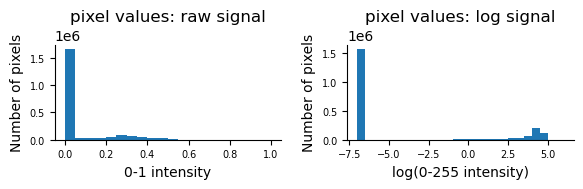

In [9]:
plt.figure(figsize=(6,2))
plt.subplot(1,2,1)
plt.hist(datacube.flatten(),np.arange(0,1.05,0.05))
plt.gca().spines[['right', 'top']].set_visible(False)
plt.gca().tick_params(axis='both',labelsize=7); 
plt.title('pixel values: raw signal'); 
plt.xlabel('0-1 intensity'); 
plt.ylabel('Number of pixels'); 
plt.subplot(1,2,2)
plt.hist(np.log(254*datacube+0.001).flatten(), np.arange(-7,6.5,0.5)); 
plt.gca().spines[['right', 'top']].set_visible(False)
plt.gca().tick_params(axis='both',labelsize=7); 
plt.title('pixel values: log signal'); 
plt.xlabel('log(0-255 intensity)'); 
plt.ylabel('Number of pixels'); 
plt.tight_layout()

### View the datacube in 3D using matplotlib

In [10]:
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import numpy as np
from skimage import measure

levels = [0.2, 0.4]; 

fig = plt.figure(figsize=(4, 4))
ax = fig.add_subplot(projection='3d')

for ci, level in enumerate(levels):
    p = datacube.transpose(2,1,0); 
    p = p[::2,::2,::2]; 
    verts, faces, normals, values = measure.marching_cubes(p, level, method='lewiner'); 
    mesh = Poly3DCollection(verts[faces], alpha=0.05)
    if ci==0:
        face_color = [1, 0.5, 0.5]
    elif ci==1:
        face_color = [0.5, 1, 0.5]
    elif ci==2:
        face_color = [0.5, 0.5, 1]
    #face_color = [0.5, 0.5, 1]
    mesh.set_facecolor(face_color)
    ax.add_collection3d(mesh)
ax.set_xlim(0, p.shape[0])
ax.set_ylim(0, p.shape[1])
ax.set_zlim(0, p.shape[2])
ax.tick_params(axis='both',labelsize=7); 
plt.close()

def animate_rot(frame):
    ax.view_init(elev=10., azim=frame, roll=None); 
    return fig

# Create the animation
anim = animation.FuncAnimation(fig, animate_rot, frames=np.linspace(0, 360, 18), interval=300)
HTML(anim.to_jshtml())


### View the datacube in 3D using plotly
> in the `go.Volume` function
- Values below isomin and above isomax are not rendered
- The range between isomin and isomax is divided into multiple isosurfaces for volume rendering
- The number of surfaces rendered is controlled by the surface_count parameter

> the output figure was not included due to its large size. 

In [ ]:
import plotly.graph_objects as go
import numpy as np
import plotly.offline as plo; 

N = datacube.shape[0]
c = np.linspace(-N/2, N/2, N)
x1, y1, z1 = np.meshgrid(c,c,c)

fig = go.Figure(data=go.Volume(
    x=x1[::2,::2,::2].flatten(),
    y=y1[::2,::2,::2].flatten(),
    z=z1[::2,::2,::2].flatten(),
    value=datacube[::2,::2,::2].transpose((1,2,0)).flatten(),
    isomin=0.2,
    isomax=0.5,
    opacity=0.1, # needs to be small to see through all surfaces
    surface_count=20, 
    colorscale='viridis',
    ))
fig.update_layout(
    width = 600, 
    height = 400,
    scene = dict(
        xaxis = dict(visible=True),
        yaxis = dict(visible=True),
        zaxis = dict(visible=True)
        ),
    scene_camera = dict(
        eye=dict(x=0.1, y=-1.25, z=0.0)
        )
)
fig.update_traces(showscale=True)
fig.show(renderer="notebook")


### Volume rendering with a transfer function
Transfer functions in volume rendering serve as a crucial mapping mechanism, translating raw voxel data values into visual properties like color and opacity. 

This transformation allows for the selective emphasis of specific features within the volumetric dataset. 

> Got help from this medium post
https://medium.com/swlh/create-your-own-volume-rendering-with-python-655ca839b097

In [12]:
# log intensity centered at 2, 3, 4 as key points

def transferFunction(x):
	
	r = 1.0*np.exp( -(x - 4.5)**2/0.5 ) +  0.2*np.exp( -(x - 3.0)**2/0.5 ) +  0.2*np.exp( -(x - 1.5)**2/0.5 )
	g = 1.0*np.exp( -(x - 4.5)**2/0.5 ) +  1.0*np.exp( -(x - 3.0)**2/0.5 ) +  0.2*np.exp( -(x - 1.5)**2/0.5 )
	b = 0.2*np.exp( -(x - 4.5)**2/0.5 ) +  0.2*np.exp( -(x - 3.0)**2/0.5 ) +  1.0*np.exp( -(x - 1.5)**2/0.5 )
	a = 0.05*np.exp( -(x - 4.5)**2/0.5 ) +  0.03*np.exp( -(x - 3.0)**2/0.5 ) + 0.01*np.exp( -(x - 1.5)**2/0.5 )
	
	return r,g,b,a

#### using matplotlib

In [13]:
N = datacube.shape[0]
c = np.linspace(-N/2, N/2, N)
x1, y1, z1 = np.meshgrid(c,c,c)
points = (c, c, c); 

imgs = []; 
Nangles = 18
for i in tqdm(np.arange(Nangles)):

    # Rotate datacube: slightly looking down
    x2 = x1 * np.cos(-2*np.pi/18) - y1 * np.sin(-2*np.pi/18); 
    y2 = x1 * np.sin(-2*np.pi/18) + y1 * np.cos(-2*np.pi/18); 
    z2 = z1; 

    # Camera angle
    angle = 2*np.pi * i / Nangles
    qxR = x2
    qyR = y2 * np.cos(angle) - z2 * np.sin(angle) 
    qzR = y2 * np.sin(angle) + z2 * np.cos(angle)
    qi = np.array([qxR.ravel(), qyR.ravel(), qzR.ravel()]).T
    
    # Interpolate onto Camera Grid
    camera_grid = interpn(points, datacube, qi, method='linear', bounds_error=False, fill_value=0).reshape((N,N,N))
    
    # Do Volume Rendering
    image = np.ones((camera_grid.shape[1],camera_grid.shape[2],3))

    for dataslice in camera_grid:
        r,g,b,a = transferFunction(np.log(dataslice*254+0.001))
        image[:,:,0] = a*r + (1-a)*image[:,:,0]
        image[:,:,1] = a*g + (1-a)*image[:,:,1]
        image[:,:,2] = a*b + (1-a)*image[:,:,2]
    
    image = np.clip(image,0.0,1.0)
    imgs.append(image); 

fig, ax = plt.subplots(figsize=(4,4))
im = ax.imshow(imgs[0],vmin=0,vmax=1,animated=True,origin='lower'); 
ax.set_axis_off()
plt.close()

def animate(i):
    im.set_data(imgs[i])
    return im, 

anim = animation.FuncAnimation(fig, animate, frames=Nangles, interval=300, blit=True); 
HTML(anim.to_jshtml())

  0%|          | 0/18 [00:00<?, ?it/s]

100%|██████████| 18/18 [00:25<00:00,  1.44s/it]
